### 1. Business understanding<a id='top'></a>

#### a) Formulate a business problem that can be solved with the dataset.

Airbnb in the United States is encountering challenges when it comes to determining the suitable price range for rental properties, considering the diverse features and characteristics associated with these properties.

#### b) For the business problem, propose 3 data science solutions and assess their feasibility. Select the final solution and explain your decision.

__Solution 1: Rental price prediction model__

* A model could be built to predict the rental price range for properties based on various features like location, number of bedrooms, amenities, etc.
* *Required data* - Historical rental property data with details on location, number of bedrooms, amenities, rental price, etc.
* *Required business capacity* - A mechanism for automatically recommending the appropriate price range for rental properties to the real estate agents.

__Solution 2: Feature importance analysis__

* A feature importance analysis could be conducted to determine which features or attributes have the greatest impact on the rental price range of properties.
* *Required data* - Historical rental property data with details on location, number of bedrooms, amenities, rental price, etc.
* *Required business capacity* - A mechanism for identifying and prioritizing important features or attributes in rental property pricing decisions.

__Solution 3: Competitor analysis__

* A model could be built to compare the rental prices of similar properties in the same geographic location.
* *Required data* - Rental property data from competitors in the same geographic location.
* *Required business capacity* - An automated system that can compare rental prices of similar properties and provide recommendations to real estate agents based on the competitive landscape.

__Final solution:__

All three solutions are viable considering the presence of historical data on rental properties. The first two solutions involve the development of predictive models, while the third solution requires a mechanism for comparing rental prices among similar properties. The feasibility of each solution hinges on the resources and infrastructure available within the real estate agency.

Given the business problem at hand, the most practical and feasible solution is to construct a rental price prediction model. This solution directly addresses the agency's challenge of determining the appropriate rental price range for properties based on various features and attributes. Moreover, the model can be seamlessly integrated into the agency's existing infrastructure, offering an automated solution for real estate agents to determine the rental price range of properties.

#### c) For the final solution, identify the prediction subject, its domain concepts, and sub-concepts (if there are any). Draw a hierarchical graph of the concepts.

__Domain concepts:__

_Airbnb listings:_ This refers to the properties that are listed on Airbnb for short-term rentals.

_Rental price:_ This is the amount of money charged by the host to rent out their property on Airbnb.

_Features and attributes:_ This includes variables such as the location, number of bedrooms and bathrooms, amenities, and other characteristics of the property that influence the rental price.

_Location:_ This refers to the geographical area where the Airbnb listing is located and how it affects the rental price.

_Occupancy rate:_ This is the percentage of time the property is rented out, which can be used as a variable in predicting the rental price.

_Competing listings:_ The presence and price of other Airbnb listings in the same geographical area can influence the optimal rental price.

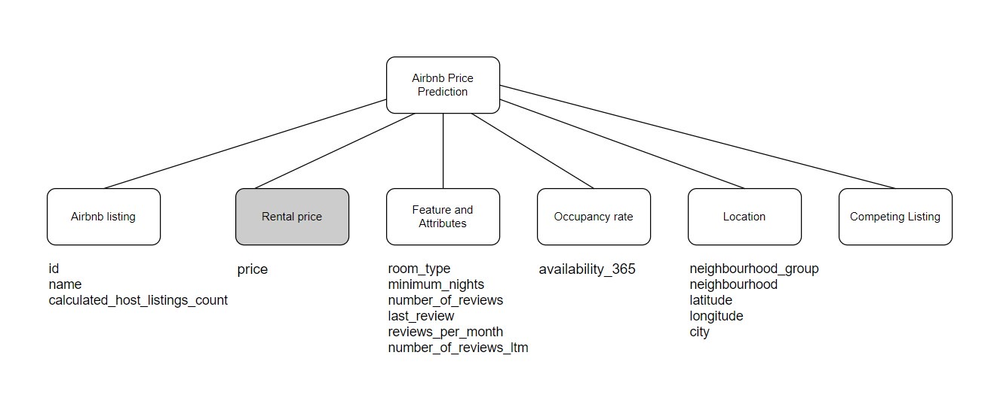

#### d) For each domain concept, design descriptive features that best describe a concept using data from the dataset. Summarize the resulting ABT in a table

| Feature Name                   | Domain Concept         | Feature Description                                      | Feature Type | Data Type |
|--------------------------------|------------------------|----------------------------------------------------------|--------------|-----------|
| id                             | Airbnb Listing         | Unique listing id                                        | Numerical    | float64   |
| name                           | Airbnb Listing         | Name of airbnb                                           | Textual      | string    |
| calculated_host_listings_count | Airbnb Listing         | Total number of listings by host                         | Numerical    | Int64     |
| room_type                      | Feature and Attributes | Type of room                                             | Textual      | string    |
| minimum_nights                 | Feature and Attributes | Minimum no. of nights required to book.                  | Numerical    | Int64     |
| number_of_reviews              | Feature and Attributes | Total number of reviews on listing                       | Numerical    | Int64     |
| last_review                    | Feature and Attributes | Date on which listing received its last review           | Interval     | string    |
| reviews_per_month              | Feature and Attributes | Average reviews per month on listing                     | Numerical    | float64   |
| number_of_reviews_ltm          | Feature and Attributes | Total reviews received by listing in last twelve months            | Numerical    | Int64     |
| neighbourhood_group            | Location               | Group in which the neighbourhood lies                    | Textual      | string    |
| neighbourhood                  | Location               | Name of the neighbourhood                                | Textual      | string    |
| latitude                       | Location               | Latitude of listing                                      | Numerical    | float64   |
| longitude                      | Location               | Longitude of listing                                     | Numerical    | float64   |
| city                           | Location               | Region of the listing                                    | Textual      | string    |
| availability_365               | Occupancy rate         | Number of days in year the listing is available for rent | Numerical    | Int64     |
| price                          | Rental price           | Price of listing per night                               | Numerical    | Int64     |

### 2. Data Exploration

#### a) Build the data quality report of the resulting ABT.

In [1]:
import pandas as pd
import warnings
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder

In [2]:
df = pd.read_csv("AB_US_2023.csv")
df.head()

C:\Users\pashi\AppData\Local\Temp\ipykernel_4840\3913932948.py:1: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("AB_US_2023.csv")


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,city
0,958.0,"Bright, Modern Garden Unit - 1BR/1BTH",1169,Holly,NaN,Western Addition,37.77028,-122.43317,Entire home/apt,202,2,383,2023-02-19,2.31,1,128,59,San Francisco
1,5858.0,Creative Sanctuary,8904,Philip And Tania,NaN,Bernal Heights,37.74474,-122.42089,Entire home/apt,235,30,111,2017-08-06,0.66,1,365,0,San Francisco
2,8142.0,Friendly Room Apt. Style -UCSF/USF - San Franc...,21994,Aaron,NaN,Haight Ashbury,37.76555,-122.45213,Private room,56,32,9,2022-10-27,0.09,13,365,1,San Francisco
3,8339.0,Historic Alamo Square Victorian,24215,Rosy,NaN,Western Addition,37.77564,-122.43642,Entire home/apt,575,9,28,2019-06-28,0.17,2,365,0,San Francisco
4,8739.0,"Mission Sunshine, with Private Bath",7149,Ivan & Wendy,NaN,Mission,37.76030,-122.42197,Private room,110,1,770,2023-02-25,4.65,2,159,34,San Francisco


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 232147 entries, 0 to 232146
Data columns (total 18 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   id                              232147 non-null  float64
 1   name                            232131 non-null  object 
 2   host_id                         232147 non-null  int64  
 3   host_name                       232134 non-null  object 
 4   neighbourhood_group             96500 non-null   object 
 5   neighbourhood                   232147 non-null  object 
 6   latitude                        232147 non-null  float64
 7   longitude                       232147 non-null  float64
 8   room_type                       232147 non-null  object 
 9   price                           232147 non-null  int64  
 10  minimum_nights                  232147 non-null  int64  
 11  number_of_reviews               232147 non-null  int64  
 12  last_review     

In [4]:
listings_df = df.convert_dtypes()
listings_df = listings_df[['neighbourhood_group','neighbourhood','latitude','longitude','room_type','price',
                          'minimum_nights','number_of_reviews','last_review','reviews_per_month','calculated_host_listings_count',
                          'availability_365','number_of_reviews_ltm','city']]
listings_df.info()

C:\Users\pashi\AppData\Local\Programs\Python\Python311\Lib\site-packages\pandas\core\dtypes\cast.py:1066: RuntimeWarning: invalid value encountered in cast
  if (arr.astype(int) == arr).all():
C:\Users\pashi\AppData\Local\Programs\Python\Python311\Lib\site-packages\pandas\core\dtypes\cast.py:1091: RuntimeWarning: invalid value encountered in cast
  if (arr.astype(int) == arr).all():


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 232147 entries, 0 to 232146
Data columns (total 14 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   neighbourhood_group             96500 non-null   string 
 1   neighbourhood                   232147 non-null  string 
 2   latitude                        232147 non-null  Float64
 3   longitude                       232147 non-null  Float64
 4   room_type                       232147 non-null  string 
 5   price                           232147 non-null  Int64  
 6   minimum_nights                  232147 non-null  Int64  
 7   number_of_reviews               232147 non-null  Int64  
 8   last_review                     183062 non-null  string 
 9   reviews_per_month               183062 non-null  Float64
 10  calculated_host_listings_count  232147 non-null  Int64  
 11  availability_365                232147 non-null  Int64  
 12  number_of_review

In [5]:
listings_df.loc[0]

neighbourhood_group                           <NA>
neighbourhood                     Western Addition
latitude                                  37.77028
longitude                               -122.43317
room_type                          Entire home/apt
price                                          202
minimum_nights                                   2
number_of_reviews                              383
last_review                             2023-02-19
reviews_per_month                             2.31
calculated_host_listings_count                   1
availability_365                               128
number_of_reviews_ltm                           59
city                                 San Francisco
Name: 0, dtype: object

##### Continous features report

In [6]:
listings_df.describe(include=['number'])

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
count,232147.0,232147.0,232147.0,232147.0,232147.0,183062.0,232147.0,232147.0,232147.0
mean,36.610585,-98.301436,259.468001,13.495867,40.91523,1.638348,29.879055,180.985686,11.689701
std,5.126523,19.706929,1024.645918,27.920631,80.649152,1.910812,106.013665,134.715299,20.599954
min,25.957323,-123.08913,0.0,1.0,0.0,0.01,1.0,0.0,0.0
25%,33.976225,-118.315111,91.0,2.0,1.0,0.31,1.0,52.0,0.0
50%,36.190556,-97.72767,149.0,3.0,9.0,1.0,2.0,175.0,3.0
75%,40.71744,-77.026222,250.0,30.0,43.0,2.42,10.0,321.0,16.0
max,47.73401,-70.996,100000.0,1250.0,3091.0,101.42,1003.0,365.0,1314.0


In [7]:
def build_continuous_features_report(data_df):
    
    """Build tabular report for continuous features"""

    stats = {
        "Count": len,
        "Miss %": lambda df: df.isna().sum() / len(df) * 100,
        "Card.": lambda df: df.nunique(),
        "Min": lambda df: df.min(),
        "1st Qrt.": lambda df: df.quantile(0.25),
        "Mean": lambda df: df.mean(),
        "Median": lambda df: df.median(),
        "3rd Qrt": lambda df: df.quantile(0.75),
        "Max": lambda df: df.max(),
        "Std. Dev.": lambda df: df.std(),
    }

    contin_feat_names = data_df.select_dtypes("number").columns
    continuous_data_df = data_df[contin_feat_names]

    report_df = pd.DataFrame(index=contin_feat_names, columns=stats.keys())

    for stat_name, fn in stats.items():
        # NOTE: ignore warnings for empty features
        with warnings.catch_warnings():
            warnings.simplefilter("ignore", category=RuntimeWarning)
            report_df[stat_name] = fn(continuous_data_df)

    return report_df

In [8]:
build_continuous_features_report(listings_df)

,Count,Miss %,Card.,Min,1st Qrt.,Mean,Median,3rd Qrt,Max,Std. Dev.
latitude,232147,0.00000,157941,25.957323,33.976225,36.610585,36.190556,40.71744,47.73401,5.126523
longitude,232147,0.00000,159908,-123.089130,-118.315111,-98.301436,-97.727670,-77.026222,-70.99600,19.706929
price,232147,0.00000,2429,0.000000,91.0,259.468001,149.000000,250.0,100000.00000,1024.645918
minimum_nights,232147,0.00000,178,1.000000,2.0,13.495867,3.000000,30.0,1250.00000,27.920631
number_of_reviews,232147,0.00000,861,0.000000,1.0,40.915230,9.000000,43.0,3091.00000,80.649152
reviews_per_month,232147,21.14393,1367,0.010000,0.31,1.638348,1.000000,2.42,101.42000,1.910812
calculated_host_listings_count,232147,0.00000,149,1.000000,1.0,29.879055,2.000000,10.0,1003.00000,106.013665
availability_365,232147,0.00000,366,0.000000,52.0,180.985686,175.000000,321.0,365.00000,134.715299
number_of_reviews_ltm,232147,0.00000,271,0.000000,0.0,11.689701,3.000000,16.0,1314.00000,20.599954


##### Categorical features report

In [9]:
listings_df.describe(exclude=['number'])

,neighbourhood_group,neighbourhood,room_type,last_review,city
count,96500,232147,232147,183062,232147
unique,30,1412,4,3147,27
top,City of Los Angeles,Unincorporated Areas,Entire home/apt,2023-03-05,New York City
freq,22204,11882,169142,5008,42931


In [10]:
def build_categorical_features_report(data_df):

    """Build tabular report for categorical features"""

    def _mode(df):
        modes = []
        for column in df.columns:
            mode_value_counts = df[column].value_counts()
            mode_freq = mode_value_counts.iloc[0]
            modes.append(mode_value_counts[mode_value_counts == mode_freq].index.tolist())
        return modes

    def _mode_freq(df):
        temp = df.apply(lambda ft: ft.value_counts()[ft.mode()].sum())
        return temp

    def _second_mode(df):
        result = []
        for col in df.columns:
            mode = df[col].mode()
            if len(mode) == 1:
                second_mode = df[~df[col].isin(mode)][col].mode().to_list()
            else:
                # If the mode is not unique, return an empty list for the second mode
                second_mode = []
            result.append(second_mode)
        return pd.Series(result, index=df.columns)

    def _second_mode_freq(df):
        return df.apply(
            lambda ft: ft[~ft.isin(ft.mode())]
            .value_counts()[ft[~ft.isin(ft.mode())].mode()]
            .sum()
        )

    stats = {
        "Count": len,
        "Miss %": lambda df: df.isna().sum() / len(df) * 100,
        "Card.": lambda df: df.nunique(),
        "Mode": _mode,
        "Mode Freq": _mode_freq,
        "Mode %": lambda df: _mode_freq(df) / len(df) * 100,
        "2nd Mode": _second_mode,
        "2nd Mode Freq": _second_mode_freq,
        "2nd Mode %": lambda df: _second_mode_freq(df) / len(df) * 100,
    }

    cat_feat_names = data_df.select_dtypes(exclude="number").columns
    continuous_data_df = data_df[cat_feat_names]

    report_df = pd.DataFrame(index=cat_feat_names, columns=stats.keys())

    for stat_name, fn in stats.items():
        # NOTE: ignore warnings for empty features
        with warnings.catch_warnings():
            warnings.simplefilter("ignore", category=RuntimeWarning)
            report_df[stat_name] = fn(continuous_data_df)

    return report_df

In [11]:
build_categorical_features_report(listings_df)

,Count,Miss %,Card.,Mode,Mode Freq,Mode %,2nd Mode,2nd Mode Freq,2nd Mode %
neighbourhood_group,232147,58.431511,30,[City of Los Angeles],22204,9.564629,[Manhattan],17658,7.606387
neighbourhood,232147,0.000000,1412,[Unincorporated Areas],11882,5.118309,[Hollywood],6005,2.586723
room_type,232147,0.000000,4,[Entire home/apt],169142,72.859869,[Private room],59759,25.741879
last_review,232147,21.143930,3147,[2023-03-05],5008,2.157254,[2023-03-12],4612,1.986672
city,232147,0.000000,27,[New York City],42931,18.493024,[Los Angeles],42451,18.286258


##### Feature visualization

In [12]:
cat_feat_names = listings_df.select_dtypes(exclude="number").columns
cat_feat_names

Index(['neighbourhood_group', 'neighbourhood', 'room_type', 'last_review',
       'city'],
      dtype='object')

In [13]:
for column in cat_feat_names:
    print(column + " :" +  str(len(listings_df[column].unique())))

neighbourhood_group :31
neighbourhood :1412
room_type :4
last_review :3148
city :27


In [14]:
category_counts = listings_df['neighbourhood_group'].value_counts()

fig = px.bar(x=category_counts.index, y=category_counts.values, title='Neighbourhood Groups')
fig.update_layout(xaxis_title='Neighbourhood Gropus', yaxis_title='Count')
fig.show()

In [15]:
category_counts = listings_df['neighbourhood'].value_counts().nlargest(50)

fig = px.bar(x=category_counts.index, y=category_counts.values, title='Top 50 Neighbourhood')
fig.update_layout(xaxis_title='Neighbourhood', yaxis_title='Count')
fig.show()

In [16]:
category_counts = listings_df['room_type'].value_counts()

fig = px.bar(x=category_counts.index, y=category_counts.values, title='Room Type')
fig.update_layout(xaxis_title='Room Type', yaxis_title='Count')
fig.show()

In [17]:
category_counts = listings_df['last_review'].value_counts().nlargest(50)

fig = px.bar(x=category_counts.index, y=category_counts.values, title='Last Review')
fig.update_layout(xaxis_title='Last Review', yaxis_title='Count')
fig.show()

In [18]:
category_counts = listings_df['city'].value_counts()

fig = px.bar(x=category_counts.index, y=category_counts.values, title='City')
fig.update_layout(xaxis_title='City', yaxis_title='Count')
fig.show()

In [19]:
contin_feat_names = listings_df.select_dtypes("number").columns



In [20]:
for column in contin_feat_names:
    print(column + " :" +  str(len(listings_df[column].unique())))

latitude :157941
longitude :159908
price :2429
minimum_nights :178
number_of_reviews :861
reviews_per_month :1368
calculated_host_listings_count :149
availability_365 :366
number_of_reviews_ltm :271


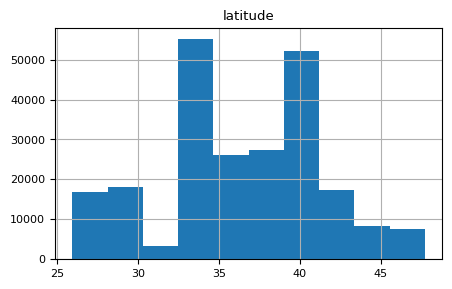

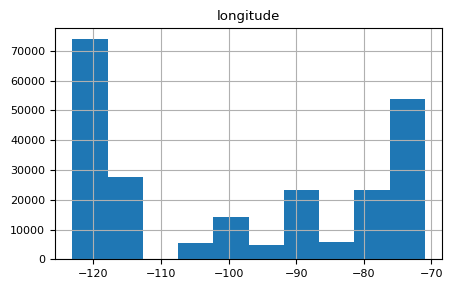

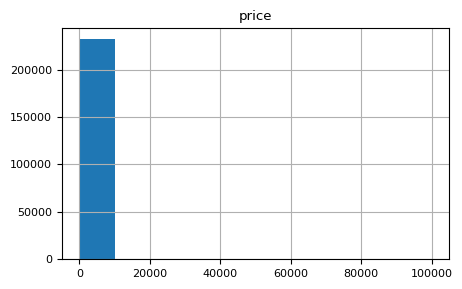

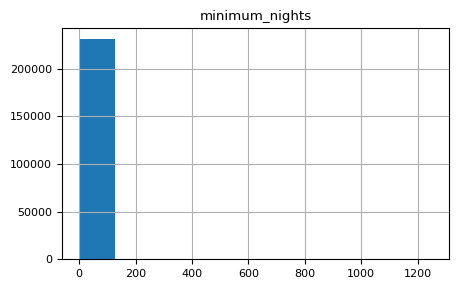

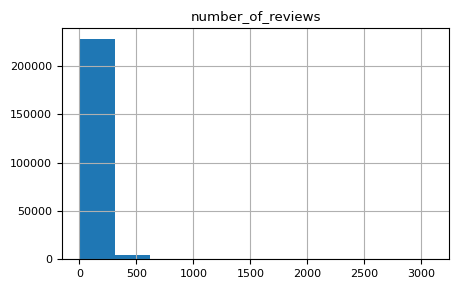

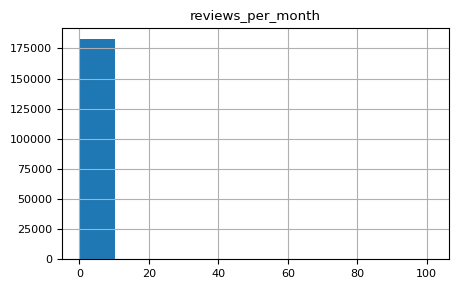

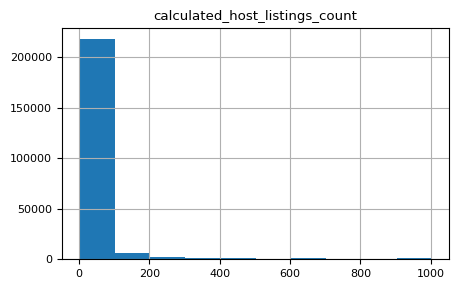

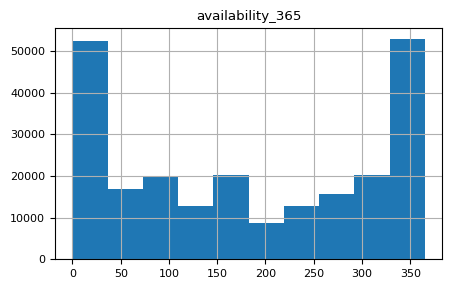

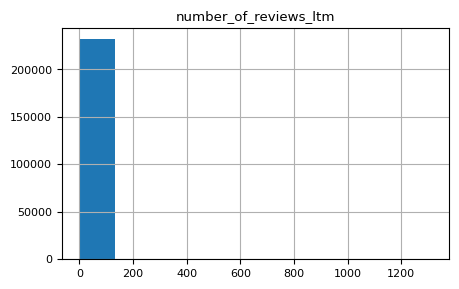

In [21]:
plt.rcParams["figure.figsize"] = [5, 3]
plt.rcParams["font.size"] = 8

listings_df.hist(column=['latitude'],);
listings_df.hist(column=['longitude']);
listings_df.hist(column=['price']);
listings_df.hist(column=['minimum_nights']);
listings_df.hist(column=['number_of_reviews']);
listings_df.hist(column=['reviews_per_month']);
listings_df.hist(column=['calculated_host_listings_count']);
listings_df.hist(column=['availability_365']);
listings_df.hist(column=['number_of_reviews_ltm']);

In [22]:
fig = px.box(listings_df, y='minimum_nights', title='Box Plot of minimum_nights')
fig.show()

In [23]:
fig = px.box(listings_df, y='price', title='Box Plot of price')
fig.show()

In [24]:
listings_df[listings_df['last_review'].isna()]

,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,city
72,<NA>,Pacific Heights,37.79434,-122.43167,Entire home/apt,649,60,0,<NA>,<NA>,1,365,0,San Francisco
215,<NA>,Financial District,37.79492,-122.40312,Private room,500,30,0,<NA>,<NA>,3,365,0,San Francisco
216,<NA>,Chinatown,37.79495,-122.40515,Private room,600,30,0,<NA>,<NA>,3,365,0,San Francisco
239,<NA>,Western Addition,37.78735,-122.43225,Entire home/apt,210,50,0,<NA>,<NA>,1,365,0,San Francisco
313,<NA>,Presidio Heights,37.78754,-122.45868,Private room,500,30,0,<NA>,<NA>,2,365,0,San Francisco
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
232142,<NA>,Unincorporated Areas,37.506164,-122.476188,Entire home/apt,389,2,0,<NA>,<NA>,1,365,0,San Mateo County
232143,<NA>,San Bruno,37.62363,-122.42657,Entire home/apt,158,1,0,<NA>,<NA>,1,364,0,San Mateo County
232144,<NA>,South San Francisco,37.655661,-122.41313,Entire home/apt,97,1,0,<NA>,<NA>,32,359,0,San Mateo County
232145,<NA>,South San Francisco,37.644792,-122.454213,Private room,62,2,0,<NA>,<NA>,3,67,0,San Mateo County


In [25]:
listings_df[listings_df['last_review'].isna() & listings_df['number_of_reviews']!=0]

,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,city


#### b) Identify data quality issues and build the data quality plan.

1. __*Missing values*__ 
* __neighbourhood_group__ has 58% missing values. So the best option would be to drop this feature. Also, neighbourhood and city are present in the dataset which can compensate the information lost by dropping neighboruhood_group.
* __last_review__ has 21% missing values. Since the missing value is less than 30%, it is not ideal to drop it. Also, last review can have a great impact on the target variable price. Further, __number_of_reviews__ which represents total number of reviews is also 0 for the cases where __last_review__ is missing which implies the correctness of the data. So, the missing values can be replaced with a dummy date.
* __reviews_per_month__ also has 21% of missing values similarly as __last_review__. The missing values can be replaced with 0. 

2. __*Outliers*__
* __price__ has a maximum value of 100,000, which is significantly higher than the 75th percentile (Q3) value of 250. This suggests the presence of potential outliers in the higher price range. Also, a standard deviation of 1024.65, indicating potential variability and the presence of outliers. In order to deal with the outliers, capping the values to the 95th percentile would be a suitable option.
* __minimum_nights__ has a maximum value of 1,250, which is significantly higher than the 75th percentile (Q3) value of 30. This suggests the presence of potential outliers in the higher minimum nights range. In order to deal with the outliers, capping the values to the 95th percentile would be a suitable option.

### Data Preparation

#### a) Preprocess your data according to the data quality plan.

In [26]:
# Droping columns
listings_df.drop('neighbourhood_group', axis=1, inplace=True)
listings_df.head()

,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,city
0,Western Addition,37.77028,-122.43317,Entire home/apt,202,2,383,2023-02-19,2.31,1,128,59,San Francisco
1,Bernal Heights,37.74474,-122.42089,Entire home/apt,235,30,111,2017-08-06,0.66,1,365,0,San Francisco
2,Haight Ashbury,37.76555,-122.45213,Private room,56,32,9,2022-10-27,0.09,13,365,1,San Francisco
3,Western Addition,37.77564,-122.43642,Entire home/apt,575,9,28,2019-06-28,0.17,2,365,0,San Francisco
4,Mission,37.7603,-122.42197,Private room,110,1,770,2023-02-25,4.65,2,159,34,San Francisco


In [27]:
# Filling NAs
listings_df['last_review'] = listings_df['last_review'].fillna('0000-01-01')
listings_df['reviews_per_month'] = listings_df['reviews_per_month'].fillna(0)
listings_df.head()

,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,city
0,Western Addition,37.77028,-122.43317,Entire home/apt,202,2,383,2023-02-19,2.31,1,128,59,San Francisco
1,Bernal Heights,37.74474,-122.42089,Entire home/apt,235,30,111,2017-08-06,0.66,1,365,0,San Francisco
2,Haight Ashbury,37.76555,-122.45213,Private room,56,32,9,2022-10-27,0.09,13,365,1,San Francisco
3,Western Addition,37.77564,-122.43642,Entire home/apt,575,9,28,2019-06-28,0.17,2,365,0,San Francisco
4,Mission,37.7603,-122.42197,Private room,110,1,770,2023-02-25,4.65,2,159,34,San Francisco


In [28]:
# Capping values to the 95th Quantile
upper_bound = 0.95
listings_df.loc[listings_df['price'] >= listings_df['price'].quantile(upper_bound), ['price']] = listings_df['price'].quantile(upper_bound)
listings_df.loc[listings_df['minimum_nights'] >= listings_df['minimum_nights'].quantile(upper_bound), ['minimum_nights']] = listings_df['minimum_nights'].quantile(upper_bound)
listings_df.head()

,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,city
0,Western Addition,37.77028,-122.43317,Entire home/apt,202,2,383,2023-02-19,2.31,1,128,59,San Francisco
1,Bernal Heights,37.74474,-122.42089,Entire home/apt,235,30,111,2017-08-06,0.66,1,365,0,San Francisco
2,Haight Ashbury,37.76555,-122.45213,Private room,56,31,9,2022-10-27,0.09,13,365,1,San Francisco
3,Western Addition,37.77564,-122.43642,Entire home/apt,575,9,28,2019-06-28,0.17,2,365,0,San Francisco
4,Mission,37.7603,-122.42197,Private room,110,1,770,2023-02-25,4.65,2,159,34,San Francisco


### Data Insights

#### a) Build the correlation heatmap of the features in the ABT. Derive insights from it and relate it to the business problem being addressed

All the features in respective domains are highly correlated with each other, for example - number_of_reviews_ltm and reviews_per_month, number_of_reviews_ltm and number_of_reviews, etc which suggests the domains were made correctly. Also, the correlation matrix correctly suggests the linear and non-linear relationship between the features and their domains.

##### i. What are the descriptive features that highly correlate with the target feature? Propose some hypotheses explaining the correlation.

Among all the features, room_type is the feature which highly correlates with the target feature. It makes sense also, as the price should be dependent on the type of room the airbnb is providing.

##### ii. What are the domain concepts that highly correlate with each other? Propose some hypotheses explaining the correlation. 

As per the correlation matrix, Airbnb listing and Occupancy Rate have a good correlation between then as availability_365 has the highest correlation with calculated_host_listings_count. Also, Features and Attributes have a good correlation with Airbnb listings as the correlation between minimum_nights, last_review, reviews_per_month and calculated_host_listings_count are good enough which suggests that Airbnb listings and their Features are related to each other, which should be the ideal case.

##### iii. Are there any features that are useless for a predictive model? 

Since, calculated_host_listings_count and neighbourhood have the correlation values near to 0 with price, makes it a bit useless features for a predictive model with comparison with other features. 

In [29]:
### categorizing data
to_categorical_list = ['neighbourhood','room_type','last_review','city']
for i in to_categorical_list:
    listings_df[i]=listings_df[i].astype('category')
    
labelencoder = LabelEncoder()
for i in to_categorical_list:
    listings_df[i] = labelencoder.fit_transform(listings_df[i])
listings_df

,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,city
0,1375,37.77028,-122.43317,0,202,2,383,3107,2.31,1,128,59,20
1,151,37.74474,-122.42089,0,235,30,111,1092,0.66,1,365,0,20
2,572,37.76555,-122.45213,2,56,31,9,2992,0.09,13,365,1,20
3,1375,37.77564,-122.43642,0,575,9,28,1777,0.17,2,365,0,20
4,821,37.7603,-122.42197,2,110,1,770,3113,4.65,2,159,34,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...
232142,1258,37.506164,-122.476188,0,389,2,0,0,0.0,1,365,0,21
232143,1089,37.62363,-122.42657,0,158,1,0,0,0.0,1,364,0,21
232144,1170,37.655661,-122.41313,0,97,1,0,0,0.0,32,359,0,21
232145,1170,37.644792,-122.454213,2,62,2,0,0,0.0,3,67,0,21


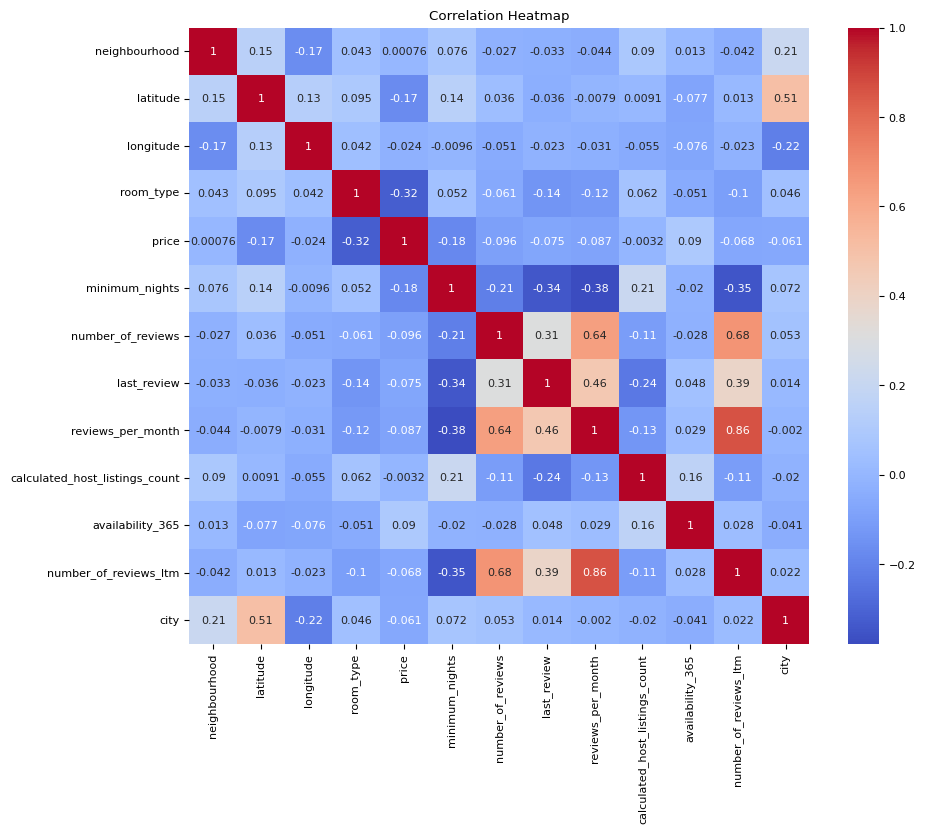

In [30]:
correlation_matrix = listings_df.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

In [ ]:
listings_df.to_csv('AB_US_2023_preprocessed.csv', index=False)

### References:

1. https://medium.com/ibm-data-science-experience/markdown-for-jupyter-notebooks-cheatsheet-386c05aeebed <a id='3'></a>
2. https://stackoverflow.com/questions/32011359/convert-categorical-data-in-pandas-dataframe
3. https://plotly.com/python/bar-charts/
4. https://towardsdatascience.com/better-heatmaps-and-correlation-matrix-plots-in-python-41445d0f2bec
5. Tutorial_1_Data_Science_Project.ipynb
6. Tutorial_2_Data_Exploration.ipynb